In [59]:
import torch
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn import model_selection, metrics, preprocessing
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
from collections import defaultdict
import json
import csv
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
import warnings
warnings.filterwarnings("ignore")

In [57]:
AutomotiveList = []
headerList = ['reviewerID', 'asin', 'overall']
with open('Automotive.json') as f:
    for jsonObj in f:
        AutoDict = json.loads(jsonObj)
        AutomotiveList.append(AutoDict)

with open('Automotive.csv', 'w') as f:
    dw = csv.DictWriter(f, delimiter=',', fieldnames=headerList)
    dw.writeheader()
    for dict in AutomotiveList:
        if dict["verified"] == True:
            f.write("%s,%s,%s\n"%(dict["reviewerID"],dict["asin"],dict["overall"]))

Started Reading JSON file which contains multiple JSON document
Printing each JSON Decoded Object


In [91]:
df=pd.read_csv('Automotive.csv')
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7990166 entries, 0 to 7990165
Data columns (total 3 columns):
 #   Column      Dtype  
---  ------      -----  
 0   reviewerID  object 
 1   asin        object 
 2   overall     float64
dtypes: float64(1), object(2)
memory usage: 182.9+ MB
None


In [72]:
class AutomotiveDataset:
    def __init__(self, users, product, ratings):
        self.users = users
        self.product = product
        self.ratings = ratings
    # len(movie_dataset)
    def __len__(self):
        return len(self.users)
    # movie_dataset[1] 
    def __getitem__(self, item):

        users = self.users[item] 
        product = self.product[item]
        ratings = self.ratings[item]
        
        return {
            "users": torch.tensor(users),
            "product": torch.tensor(product),
            "ratings": torch.tensor(ratings),
        }

In [73]:
class RecSysModel(nn.Module):
    def __init__(self, n_users, n_products):
        super().__init__()
        # trainable lookup matrix for shallow embedding vectors
        
        self.user_embed = nn.Embedding(n_users, 32)
        self.product_embed = nn.Embedding(n_products, 32)
        # user, product embedding concat
        self.out = nn.Linear(64, 1)
    def forward(self, users, product, ratings=None):
        user_embeds = self.user_embed(users)
        product_embeds = self.product_embed(product)
        output = torch.cat([user_embeds, product_embeds], dim=1)
        
        output = self.out(output)
        
        return output  

In [74]:
lbl_user = preprocessing.LabelEncoder()
lbl_product = preprocessing.LabelEncoder()
df.reviewerID = lbl_user.fit_transform(df.reviewerID.values)
df.asin = lbl_product.fit_transform(df.asin.values)

#Split training and testing data

df_train, df_test = model_selection.train_test_split(
    df, test_size=0.2#, random_state=42, stratify=df.overall.values
)

In [75]:
#Create train and test dataset
train_dataset = AutomotiveDataset(
    users=df_train.reviewerID.values,
    product=df_train.asin.values,
    ratings=df_train.overall.values
)

test_dataset = AutomotiveDataset(
    users=df_test.reviewerID.values,
    product=df_test.asin.values,
    ratings=df_test.overall.values
)

In [76]:
# Create train and test dataloaders
train_loader = DataLoader(dataset=train_dataset,
                          batch_size=64,
                          shuffle=True) 

test_loader = DataLoader(dataset=test_dataset,
                          batch_size=64,
                          shuffle=True) 

dataiter = iter(train_loader)
dataloader_data = next(dataiter) 
print(dataloader_data)

{'users': tensor([ 85591, 115086,  13648, 130244,  31663, 175896,  56266, 142249,  22136,
         54301, 177875, 128324, 120742,  47137, 151001, 125933, 164934,  78824,
         43414, 183497,  21754,  19246,  63728, 118758,  13168,  64020, 228221,
        192236,   4536,  41964, 189551,  52549,  93786, 154885,  48608, 199639,
        100500, 151862, 105740,  34652, 164003,  46076,  42819,  61921, 216574,
         81115, 219079,  10754, 142622, 161697,  75939, 120051,  75740,  73285,
         63413, 184387, 194580, 127101,  28597, 202154, 225280,  88643, 122225,
         72884]), 'product': tensor([ 238, 2469, 2604, 3462, 1900, 1212, 1704, 2026, 1871, 3838, 2001, 2424,
        3838,  325, 3216,  596,  325, 2771, 2813, 2031, 3488, 1651,  895, 2466,
         462, 1125,  252,  958, 3422, 1816, 1782, 1143, 2893,  943, 3767,  573,
        3488, 1974, 2007,  320, 3838, 2219, 3437, 2216,  854,  553, 3180, 2734,
        2886, 1760, 2876, 1491,  961,    0, 1993, 3552, 2709, 1484, 1990, 3493,
 

In [77]:
model = RecSysModel(
    n_users=len(lbl_user.classes_),
    n_products=len(lbl_product.classes_),
).to(device)
optimizer = torch.optim.Adam(model.parameters())  
sch = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.7)

loss_func = nn.MSELoss()

In [10]:
# print(len(lbl_user.classes_))
# print(len(lbl_product.classes_))
# print(df.asin.max())
# print(len(train_dataset))
# print(dataloader_data['users'])
# print(dataloader_data['users'].size())
# print(dataloader_data['product'] )
# print(dataloader_data['product'].size())
# print(dataloader_data['ratings'] )
# print(dataloader_data['ratings'].size())

In [78]:
user_embed = nn.Embedding(len(lbl_user.classes_), 32)
product_embed = nn.Embedding(len(lbl_product.classes_), 32)

out = nn.Linear(64, 1)

user_embeds = user_embed(dataloader_data['users'])
product_embeds = product_embed(dataloader_data['product'])

In [12]:
# print(f"user_embeds {user_embeds.size()}")
# print(f"user_embeds {user_embeds}")
# print(f"product_embeds {product_embeds.size()}")
# print(f"product_embeds {product_embeds}")

In [79]:
output = torch.cat([user_embeds, product_embeds], dim=1) 
# print(f"output: {output.size()}")
# print(f"output: {output}")
output = out(output)
# print(f"output: {output}")

In [80]:
with torch.no_grad():
    model_output = model(dataloader_data['users'], 
                   dataloader_data["product"])

#     print(f"model_output: {model_output}, size: {model_output.size()}")

In [81]:
rating = dataloader_data["ratings"]
# print(rating)
# print(rating.view(64, 1))
# print(model_output)
# print(rating.sum())
# print(model_output.sum() - rating.sum())

In [119]:
epochs = 5
total_loss = 0
step_cnt = 0
plot_steps, print_steps = 5000, 5000
all_losses_list = [] 

gradient_accumulation_steps = 8

model.train() 
for epoch_i in range(epochs):
    for i, train_data in enumerate(train_loader):
        output = model(train_data["users"], 
                       train_data["product"])
        
        rating = train_data["ratings"].view(-1,1).to(torch.float32)

        loss = loss_func(output, rating)
        loss = loss / gradient_accumulation_steps
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if (i + 1) % gradient_accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad()
            
        total_loss += loss.item()    

        step_cnt = step_cnt + len(train_data["users"])
#         print(step_cnt % plot_steps)
        
        if(step_cnt % plot_steps == 0):
            avg_loss = total_loss / (len(train_data["users"]) * plot_steps)
            print(f"epoch {epoch_i} loss at step: {step_cnt} is {avg_loss}")
            all_losses_list.append(avg_loss)
            total_loss=0

    # Validate the model and adjust learning rate
    model.eval()
    with torch.no_grad():
        validation_loss = 0
        for j, test_data in enumerate(test_loader):
            val_output = model(test_data["users"], 
                               test_data["product"])
            val_rating = test_data["ratings"].view(-1, 1).to(torch.float32)
            val_loss = loss_func(val_output, val_rating)
            validation_loss += val_loss.item()
            
        
        # Adjust learning rate based on validation loss
        sch.step(validation_loss)
        print("Done")

    model.train()

epoch 0 loss at step: 40000 is 0.0004132169951684773
epoch 0 loss at step: 80000 is 0.0004039715583669022
epoch 0 loss at step: 120000 is 0.0004046673968434334
epoch 0 loss at step: 160000 is 0.00041131778513081374
epoch 0 loss at step: 200000 is 0.00040817385404370724
Done
Done
Done
Done
Done


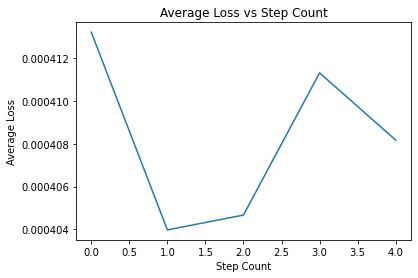

In [120]:
plt.figure()
plt.plot(all_losses_list)
plt.title("Average Loss vs Step Count")
plt.xlabel("Step Count")
plt.ylabel("Average Loss")
plt.draw() 
plt.show()

In [93]:
###Calculating MAE####
from sklearn.metrics import mean_absolute_error

model_output_list = []
target_rating_list = []

model.eval()

with torch.no_grad():
    for i, test_data in enumerate(test_loader): 
        model_output = model(test_data['users'], test_data["product"])
        
        model_output_list.append(model_output.sum().item() / len(test_data['users']) )

        target_rating = test_data["ratings"]
        
        target_rating_list.append(target_rating.sum().item() / len(test_data['users']))

mae = mean_absolute_error(target_rating_list, model_output_list)
print(f"mae: {mae}")

mae: 0.19289458465649845


In [20]:
#####Calculating RMSE#######

In [94]:
#####Calculating RMSE#######
from sklearn.metrics import mean_squared_error

# squared If True returns MSE value, if False returns RMSE value.
rms = mean_squared_error(target_rating_list, model_output_list, squared=False)
print(f"rms: {rms}")

rms: 0.23186022205747872


In [63]:
# def recommend_items(model, test_dataset, train_dataset):
#     all_product = set(range(len(lbl_product.classes_)))
#     recommendations = {}
#     for user in set(test_dataset.users):
#         purchased_product = set(train_dataset.product[train_dataset.users == user])
#         product_to_rate = list(all_product - purchased_product)
#         predicted_ratings = model(torch.tensor([user]*len(product_to_rate)), torch.tensor(product_to_rate))
#         top_10_product = [product_to_rate[i] for i in predicted_ratings.argsort(descending=True)[:10]]
#         recommendations[user] = top_10_product
#     return recommendations

# # # recommendations = recommend_items(model, test_dataset, train_dataset)

In [24]:
# recommendations = recommend_items(model, test_dataset, train_dataset)
# print(recommendations)

In [67]:
# def recommend_items(model, user_id, train_data, num_items=10):
#     # Get the list of all items
#     all_items = set(train_data['asin'].unique())
    
#     # Get the items that the user has already purchased (from the training data)
#     purchased_items = set(train_data[train_data['reviewerID'] == user_id]['asin'].unique())
    
#     # Get the items that the user has not purchased
#     not_purchased_items = all_items - purchased_items
    
#     # Convert to PyTorch tensor
#     not_purchased_items = torch.tensor(list(not_purchased_items)).to(device)
    
#     # Create a tensor of the user_id repeated for all not_purchased_items
#     user_ids = torch.tensor([user_id] * len(not_purchased_items)).to(device)
    
#     # Predict the ratings for all not_purchased_items
#     predicted_ratings = model(user_ids, not_purchased_items).detach().cpu().numpy().flatten()
    
#     # Get the indices of the top num_items ratings
#     recommended_indices = np.argsort(-predicted_ratings)[:num_items]
    
#     # Get the item ids of the top num_items ratings
#     recommended_items = not_purchased_items[recommended_indices]
    
#     return recommended_items

In [25]:
# for user_id in df_test['reviewerID'].unique():
#     recommended_items = recommend_items(model, user_id, df_train)
# #     original_user_id = lbl_user.inverse_transform([user_id])
# #     recommended_item_ids = lbl_product.inverse_transform(recommended_items)
#     print(f"Recommended items for user {user_id}: {recommended_items}")

In [95]:
def recommended_items(model, n_items=10):
    # Get all user IDs in the testing set
    user_ids = df_test['reviewerID'].unique()
    
    # Initialize a dictionary to store recommendations for all users
    recommendations = {}
    
    # Iterate over all users
    for user_id in user_ids:
        # Get the items that the user has already purchased
        purchased_items = df_train.loc[df_train['reviewerID'] == user_id, 'asin'].unique()

        # Get all items
        all_items = df['asin'].unique()

        # Get the items that the user has not purchased
        not_purchased_items = np.setdiff1d(all_items, purchased_items)

        # Convert data to tensors
        user_ids_tensor = torch.tensor([user_id]*len(not_purchased_items))
        item_ids_tensor = torch.tensor(not_purchased_items)

        # Predict ratings for not purchased items
        predicted_ratings = model(user_ids_tensor.to(device), item_ids_tensor.to(device)).detach().cpu().numpy().flatten()

        # Get top n items
        recommended_item_ids = not_purchased_items[np.argsort(-predicted_ratings)][:n_items]
        
        # Convert item IDs to original labels
        recommended_item_labels = lbl_product.inverse_transform(recommended_item_ids)
        
        # Convert user ID to original label
        original_user_id = lbl_user.inverse_transform([user_id])[0]
        
        # Store recommendations for this user
        recommendations[original_user_id] = recommended_item_labels
    
    return recommendations

# Example usage

In [23]:
recommendations = recommended_items(model)
print(recommendations)

{'A1H25STSH6YWIV': array(['B0001EVUE0', 'B0002UQAN4', 'B0007M3094', 'B0007O8P7E',
       'B00062YIPA', 'B0006H8PHW', '0983270171', 'B0002T8GL4',
       'B0006309VG', 'B0002M7176'], dtype=object), 'A2SAD8MSREYT30': array(['B0001EVUE0', 'B0002UQAN4', 'B0007M3094', 'B0007O8P7E',
       'B00062YIPA', 'B0006H8PHW', '0983270171', 'B0002T8GL4',
       'B0006309VG', 'B0002M7176'], dtype=object), 'ARP8236ONTNS8': array(['B0001EVUE0', 'B0002UQAN4', 'B0007M3094', 'B0007O8P7E',
       'B00062YIPA', 'B0006H8PHW', '0983270171', 'B0002T8GL4',
       'B0006309VG', 'B0002M7176'], dtype=object), 'AI9PVGY7PNSFY': array(['B0001EVUE0', 'B0002UQAN4', 'B0007M3094', 'B0007O8P7E',
       'B00062YIPA', 'B0006H8PHW', '0983270171', 'B0002T8GL4',
       'B0006309VG', 'B0002M7176'], dtype=object), 'A2QY114T8ZK0VO': array(['B0001EVUE0', 'B0002UQAN4', 'B0007M3094', 'B0007O8P7E',
       'B00062YIPA', 'B0006H8PHW', '0983270171', 'B0002T8GL4',
       'B0006309VG', 'B0002M7176'], dtype=object), 'A3GECE2KKSE8R8': array(['

In [100]:
###############
from sklearn.metrics import precision_score, recall_score, f1_score

def evaluate_ranking(model, data_loader):
    model.eval()
    true_labels = []
    predictions = []
    total_samples = 0
    num_conversions = 0
    with torch.no_grad():
        for i,data in enumerate(data_loader):
            user_ids = data["users"]
            item_ids = data["product"] 
            ratings = data["ratings"] 
            user_ids = user_ids.to(torch.long).to(device)
            item_ids = item_ids.to(torch.long).to(device)
            ratings = ratings.view(-1,1).to(torch.float32).to(device)
            output = model(user_ids,item_ids) 
            true_labels.extend(ratings.cpu().numpy().flatten())
            predictions.extend(torch.floor(output).cpu().numpy().flatten())
            pred_conv = torch.floor(output).cpu().numpy().flatten()
            num_conversions += len(predictions)
            total_samples += sum(predictions)
    precision = precision_score(true_labels, predictions, average='weighted', zero_division = 0)
    recall = recall_score(true_labels, predictions, average='weighted', zero_division = 0)
    fmeasure = f1_score(true_labels, predictions, average='weighted', zero_division = 0)
    conversion_rate = (num_conversions / total_samples) * 100
    return precision, recall, fmeasure, conversion_rate

In [101]:
precision, recall, fmeasure, conversion_rate = evaluate_ranking(model, test_loader)
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F-measure: {fmeasure:.4f}')
print("Conversion Rate: {:.2f}%".format(conversion_rate))

Precision: 0.5911
Recall: 0.1307
F-measure: 0.0597
Conversion Rate: 27.46%


In [66]:
def calculate_conversion_rate(model, data_loader):
    model.eval()
    total_samples = 0
    num_conversions = 0
    with torch.no_grad():
        for data in data_loader:
            user_ids = data["users"]
            item_ids = data["product"] 
            ratings = data["ratings"] 
            user_ids = user_ids.to(torch.long).to(device)
            item_ids = item_ids.to(torch.long).to(device)
            ratings = ratings.view(-1, 1).to(torch.float32).to(device)
            output = model(user_ids, item_ids) 
            predictions = torch.floor(output).cpu().numpy().flatten()
            num_conversions += len(predictions)  # Count positive predictions as conversions
            total_samples += sum(predictions)
    
    conversion_rate = (num_conversions / total_samples) * 100
    return conversion_rate

# Example usage
conversion_rate = calculate_conversion_rate(model, test_loader)
print("Conversion Rate: {:.2f}%".format(conversion_rate))

Conversion Rate: 26.63%


In [350]:
# def evaluate_recommendations(model, test_data, train_data, num_items=10):
#     precision_list = []
#     recall_list = []
#     f_measure_list = []
#     conversion_rate_list = []

#     for user_id in test_data['reviewerID'].unique():
#         recommended_items = recommend_items(model, user_id, train_data, num_items)

#         # Placeholder for ground truth relevant items or user-item interaction data
#         ground_truth_items = []

#         # Placeholder for user's interactions with recommended items
#         user_interactions = []

#         # Calculate metrics
#         relevant_items = set(ground_truth_items)
#         recommended_set = set(recommended_items)
#         relevant_and_recommended = relevant_items.intersection(recommended_set)

#         precision = len(relevant_and_recommended) / len(recommended_set) if len(recommended_set) > 0 else 0
#         recall = len(relevant_and_recommended) / len(relevant_items) if len(relevant_items) > 0 else 0
#         f_measure = (2 * precision * recall) / (precision + recall) if precision + recall > 0 else 0
#         conversion_rate = len(user_interactions) / len(recommended_items) if len(recommended_items) > 0 else 0

#         # Append metrics to the lists
#         precision_list.append(precision)
#         recall_list.append(recall)
#         f_measure_list.append(f_measure)
#         conversion_rate_list.append(conversion_rate)

#     # Calculate average metrics
#     avg_precision = sum(precision_list) / len(precision_list)
#     avg_recall = sum(recall_list) / len(recall_list)
#     avg_f_measure = sum(f_measure_list) / len(f_measure_list)
#     avg_conversion_rate = sum(conversion_rate_list) / len(conversion_rate_list)

#     return avg_precision, avg_recall, avg_f_measure, avg_conversion_rate

# # Call the function to evaluate the recommendation system
# precision, recall, f_measure, conversion_rate = evaluate_recommendations(model, df_test, df_train)
# print(f"Precision: {precision}")
# print(f"Recall: {recall}")
# print(f"F-measure: {f_measure}")
# print(f"Conversion rate: {conversion_rate}")


Precision: 0.0
Recall: 0.0
F-measure: 0.0
Conversion rate: 0.0


In [257]:
# def evaluate(model, test_data, train_data, num_items=10):
#     # Initialize counts for true positives, false positives and false negatives
#     tp = 0
#     fp = 0
#     fn = 0
    
#     # Iterate over all users in the test data
#     for user_id in test_data['reviewerID'].unique():
#         # Get the items that the user has purchased in the test data (ground truth)
#         purchased_items = set(test_data[test_data['reviewerID'] == user_id]['asin'].unique())
        
#         # Get the recommended items for the user
#         recommended_items = set(recommend_items(model, user_id, train_data, num_items))
        
#         # Calculate true positives, false positives and false negatives
#         tp += len(purchased_items & recommended_items)
#         fp += len(recommended_items - purchased_items)
#         fn += len(purchased_items - recommended_items)
    
#     # Calculate precision, recall and F-measure
#     precision = tp / (tp + fp) if (tp + fp) > 0 else 0
#     recall = tp / (tp + fn) if (tp + fn) > 0 else 0
#     f_measure = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    
#     return precision, recall, f_measure

# precision, recall, f_measure = evaluate(model, df_test, df_train)
# print(f"Precision: {precision:.4f}")
# print(f"Recall: {recall:.4f}")
# print(f"F-measure: {f_measure:.4f}")

Precision: 0.0000
Recall: 0.0000
F-measure: 0.0000


In [33]:
# def mean_average_precision(model, test_data, train_data, num_items=10):
#     # Initialize the sum of average precisions
#     sum_avg_precision = 0
    
#     # Iterate over all users in the test data
#     for user_id in test_data['reviewerID'].unique():
#         # Get the items that the user has purchased in the test data (ground truth)
#         purchased_items = set(test_data[test_data['reviewerID'] == user_id]['asin'].unique())
        
#         # Get the recommended items for the user
#         recommended_items = recommend_items(model, user_id, train_data, num_items)
        
#         # Initialize count for relevant items
#         relevant_count = 0
        
#         # Initialize sum of precisions
#         sum_precision = 0
        
#         # Iterate over all recommended items
#         for i, item in enumerate(recommended_items):
#             if item in purchased_items:
#                 relevant_count += 1
#                 precision = relevant_count / (i + 1)
#                 sum_precision += precision
        
#         # Calculate average precision for this user
#         avg_precision = sum_precision / len(purchased_items) if len(purchased_items) > 0 else 0
        
#         # Add to sum of average precisions
#         sum_avg_precision += avg_precision
    
#     # Calculate mean average precision
#     map = sum_avg_precision / len(test_data['reviewerID'].unique())
    
#     return map

# map = mean_average_precision(model, df_test, df_train)
# print(f"Mean Average Precision: {map:.4f}")

In [209]:
# Iterate over each user in the testing set
# model.eval()
# recommended_items = []
# with torch.no_grad():
#     for i, test_data in enumerate(test_loader): 
#         model_output = model(test_data['users'], test_data["product"])
#         users = test_data['users']
#         product = test_data['product']
#         relevance_scores = torch.matmul(product, users)
# #         for i in range(len(users)):
# #             user_id = users[i].item()
# #             product_id = product[i].item() 
# #             relevance_scores = torch.matmul(product_id, user_id)
#         sorted_items = torch.argsort(relevance_scores, descending=True)
#         sorted_items = sorted_items.unsqueeze(0)
#         recommendation_list = sorted_items[:10]
# #         print("User:", users)
# #         print("Recommendations:", recommendation_list)

In [232]:
# with torch.no_grad():
#     for i, test_data in enumerate(test_loader): 
#         users = test_data['users']
#         product = test_data['product']
#         ratings = test_data['ratings']
        
#         model_output = model(test_data['users'], test_data["product"])

#         for i in range(len(users)):
#             user_id = users[i].item()
#             product_id = product[i].item() 
#             pred_rating = model_output[i][0].item()
#             sorted_items = torch.argsort(model_output[i][0], descending=True)
#             sorted_items = sorted_items.unsqueeze(0)
#             recommendation_list = sorted_items[:10]
#             print("User:", user_id)
#             print("Recommendations:", recommendation_list)

In [186]:
#####Calculating Precision, Recall######

In [102]:
# a dict that stores a list of predicted rating and actual rating pair for each user 
user_rating_true = defaultdict(list)

# iterate through the test data to build the user-> [(y1, y1_hat), (y2, y2_hat)...]   
with torch.no_grad():
    for i, test_data in enumerate(test_loader): 
        users = test_data['users']
        product = test_data['product']
        ratings = test_data['ratings']
        
        output = model(test_data['users'], test_data["product"])

        for i in range(len(users)):
            user_id = users[i].item()
            product_id = product[i].item() 
            pred_rating = output[i][0].item()
            true_rating = ratings[i].item()
            
#             print(f"{user_id}, {product_id}, {pred_rating}, {true_rating}")
            user_rating_true[user_id].append((pred_rating, true_rating))

In [103]:
with torch.no_grad():
    precisions = {}
    recalls = {}

    k=10
    threshold=3.5

    for uid, user_ratings in user_est_true.items():

        # Sort user ratings by estimated value. 
        user_ratings.sort(key=lambda x: x[0], reverse=True)

        #get the number of actual relevant item
        n_rel = sum((true_r >= threshold) for (_, true_r) in user_ratings)

        #get the number of recommended item that are predicted relevent and within topk
        n_rec_k = sum((est >= threshold) for (est, _) in user_ratings[:k])

        #get the number of recommented item that' is also actually relevant within topk
        n_rel_and_rec_k = sum(
            ((true_r >= threshold) and (est >= threshold))
            for (est, true_r) in user_ratings[:k]
        )

#         print(f"uid {uid},  n_rel {n_rel}, n_rec_k {n_rec_k}, n_rel_and_rec_k {n_rel_and_rec_k}")

        # Precision@K: Proportion of recommended items that are relevant
        # When n_rec_k is 0, Precision is undefined. We here set it to 0.

        precisions[uid] = n_rel_and_rec_k / n_rec_k if n_rec_k != 0 else 0

        # Recall@K: Proportion of relevant items that are recommended
        # When n_rel is 0, Recall is undefined. We here set it to 0.

        recalls[uid] = n_rel_and_rec_k / n_rel if n_rel != 0 else 0

In [104]:
# Precision and recall can then be averaged over all users
print(f"precision @ {k}: {sum(prec for prec in precisions.values()) / len(precisions)}")

print(f"recall @ {k} : {sum(rec for rec in recalls.values()) / len(recalls)}")

precision @ 10: 0.7580396364234807
recall @ 10 : 0.7581108452647702
